# Montar drive y seleccionar carpeta de TT

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
# Ruta de la carpeta en Google Drive
carpeta_drive = '/content/drive/My Drive/TT'
# Cambia la ruta de la carpeta_drive por la ruta real de la carpeta en tu Google Drive
os.chdir(carpeta_drive)

In [ ]:
!ls

CODE		  lime_explanation.html      tfidf_vectorizer.pkl	 tree_rules.txt
coefficients.csv  modelo_arbol_decision.pkl  top_negative_variables.csv  X_test_tfidf.pkl
CORPUS		  test_data.csv		     top_positive_variables.csv  X_train_tfidf.pkl


# Readme
Si ya existen los archivos pkl  solo corre librerias y abre los docuentos  de la seccion guardar y abrir dataset solo ejecuta la segunda seccion de abrir los documentos   de ahi en adelante tu codigo

# Librerias

In [ ]:
!pip install xlrd


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# abrir archivo y dividivir
si quieres cambiar el corpus aqui cambia el nombre de la carpeta  igual si quieres volverlo a guardar o asi aqui

In [ ]:
#si solo quieres cambiar el corpus con el que se trabaja cambia aqui  y  sigue las instrucciones del readme
nombredecarpetaatrabajar="IMDB/"
#nombredecarpetaatrabajar="REST_MEX/"
#nombredecarpetaatrabajar="SENTIMENTS/"
#nombredecarpetaatrabajar="TASS/"


In [ ]:
#sentiments
#nombredearchivo="sentiment_analysis_dataset.csv"
#IMDB
nombredearchivo="IMDBDatasetSPANISH.csv"
#REST MEX
#nombredearchivo="Rest_Mex_Sentiment_Analysis_2023_Train.xlsx"
#TASS
#nombredearchivo="tass.csv"
nombre_archivo = 'CORPUS/'+ nombredecarpetaatrabajar+nombredearchivo
print(nombre_archivo)



CORPUS/IMDB/IMDBDatasetSPANISH.csv


In [ ]:
# Función para detectar el tipo de archivo y cargarlo
def cargar_archivo(nombre_archivo):
    if nombre_archivo.endswith('.xlsx'):
        df = pd.read_excel(nombre_archivo)
    elif nombre_archivo.endswith('.csv'):
        df = pd.read_csv(nombre_archivo)
    else:
        raise ValueError("Formato de archivo no compatible.")
    return df

# Cargar el archivo
try:
    datos = cargar_archivo(nombre_archivo)

    print("Archivo cargado con éxito.")
except ValueError as e:
    print("Error:", e)

Archivo cargado con éxito.


## Binarizar IMDB


In [ ]:
datos['sentimiento'] = datos['sentimiento'].replace({'positivo': 1, 'negativo': 0})

## Binarizar REST

In [ ]:

# Contar filas antes de eliminar NaN
antes = len(datos)

# Reemplazar los valores en la columna 'Polarity'
datos['Polarity'] = datos['Polarity'].replace({1: 0, 2: 0, 3 : np.nan, 4: 1, 5: 1})

# Eliminar filas con NaN en la columna 'Polarity'
datos.dropna(subset=['Polarity'], inplace=True)

print(datos)

# Contar filas después de eliminar NaN
despues = len(datos)

print("Número de filas antes de eliminar NaN:", antes)
print("Número de filas después de eliminar NaN:", despues)


                                Title  \
0                   LINDA EXPERIENCIA   
1                         Plaza típca   
2              Tres días en La Habana   
3                         Recomendado   
4              Caro pero vale la pena   
...                               ...   
251697  Verdadera joya arquitectónica   
251698                      Romántico   
251699             Parece un castillo   
251700                     Imperdible   
251701               Muy bonita vista   

                                                   Review  Polarity   Country  \
0       Hermoso lugar para admirar las obras de Botero...       1.0  Colombia   
1       No puedes dejar pasar sus vistas y arquitectur...       1.0      Cuba   
2       Este es un hotel lleno de historia y carácter....       1.0      Cuba   
3       Justo lo que buscaba. Sabores exoticos, buena ...       1.0  Colombia   
4       La comida es muy buena, desde las entradas has...       1.0    Mexico   
...                  

## Binarizar Sentiments

In [ ]:
palabras_positivas = ['peaceful', 'powerful', 'joyful', 'loving', 'thankful', 'secure', 'confident', 'successful', 'surprised', 'playful', 'optimistic', 'daring']
palabras_no_positivas = ['scared', 'mad', 'sad', 'overwhelmed', 'embarrassed', 'jealous', 'irritated', 'frustrated', 'distant', 'stupid', 'isolated', 'sleepy', 'responsive']

# Reemplazar palabras positivas por 1 y palabras no positivas por 0
mapeo = {palabra: 1 for palabra in palabras_positivas}
mapeo.update({palabra: 0 for palabra in palabras_no_positivas})
datos = datos.loc[datos['sentiment'] != 'peaceful']
# Realizar el reemplazo en la columna 'sentimientos'
datos['sentiment'] = datos['sentiment'].replace(mapeo)
datos['emotion'] = datos['emotion'].replace(mapeo)

datos.drop(['emotion'], axis=1, inplace=True)


<ipython-input-39-05fabad2fd2f>:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  datos['sentiment'] = datos['sentiment'].replace(mapeo)
<ipython-input-39-05fabad2fd2f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['sentiment'] = datos['sentiment'].replace(mapeo)
<ipython-input-39-05fabad2fd2f>:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior

In [ ]:
print(datos)

                 tweetid            user  \
0     142389495503925248      ccifuentes   
1     142389933619945473  CarmendelRiego   
2     142391947707940864  CarmendelRiego   
3     142416095012339712    mgilguerrero   
4     142422495721562112        paurubio   
...                  ...             ...   
7214  189809904935120896    mariviromero   
7215  189814854503235584    mariviromero   
7216  189815389021143041    mariviromero   
7217  189824278827507712      Tonicanto1   
7218  189830265655410688    RodolfoIrago   

                                                content                 date  \
0           Salgo de #VeoTV , que día más largoooooo...  2011-12-02T00:47:55   
1     @PauladeLasHeras No te libraras de ayudar me/n...  2011-12-02T00:49:40   
2                             @marodriguezb Gracias MAR  2011-12-02T00:57:40   
3     Off pensando en el regalito Sinde, la que se v...  2011-12-02T02:33:37   
4     Conozco a alguien q es adicto al drama! Ja ja ...  2011-12-02T02:

In [ ]:
datos['sentiment_valueBinarizado'] = datos['sentiment_value'].replace({'P': 1,'P+': 1, 'NEU':np.nan ,'NONE':np.nan,'N+':0,'N': 0})

<ipython-input-62-54877602f043>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  datos['sentiment_valueBinarizado'] = datos['sentiment_value'].replace({'P': 1,'P+': 1, 'NEU':np.nan ,'NONE':np.nan,'N+':0,'N': 0})


In [ ]:

antes = len(datos)

datos.dropna(subset=['sentiment_valueBinarizado'], inplace=True)
despues = len(datos)

print("Número de filas antes de eliminar NaN:", antes)
print("Número de filas después de eliminar NaN:", despues)

Número de filas antes de eliminar NaN: 7219
Número de filas después de eliminar NaN: 5066


## Divide el dataset


In [ ]:
train_data, test_data = train_test_split(datos, test_size=0.2, random_state=42)

# Guardar y abrir dataset

In [ ]:
# Guardar los conjuntos de datos
train_data.to_pickle('CORPUS/'+nombredecarpetaatrabajar+'/train_data.pkl')
test_data.to_pickle('CORPUS/'+nombredecarpetaatrabajar+'/test_data.pkl')

NameError: name 'train_data' is not defined

este es para abrir

In [ ]:
# Cargar los conjuntos de datos desde los archivos .pkl
train_data = pd.read_pickle('CORPUS/'+nombredecarpetaatrabajar+'/train_data.pkl')
test_data = pd.read_pickle('CORPUS/'+nombredecarpetaatrabajar+'/test_data.pkl')

# verifica cantidad y datos

In [ ]:
# Visualizar el conjunto de datos de entrenamiento
print("Conjunto de datos de entrenamiento:")
print(train_data.head())

# Visualizar el conjunto de datos de prueba
print("\nConjunto de datos de prueba:")
print(test_data.head())

# Visualizar la cantidad de datos en cada conjunto
print("Cantidad de datos en el conjunto de entrenamiento:", len(train_data))
print("Cantidad de datos en el conjunto de prueba:", len(test_data))



Conjunto de datos de entrenamiento:
       Unnamed: 0                                          review_en  \
39087       39087  That's what I kept asking myself during the ma...   
30893       30893  I did not watch the entire movie. I could not ...   
45278       45278  A touching love story reminiscent of In the M...   
16398       16398  This latter-day Fulci schlocker is a totally a...   
13653       13653  First of all, I firmly believe that Norwegian ...   

                                               review_es sentiment  \
39087  Eso es lo que seguí preguntándome durante las ...  negative   
30893  No vi a toda la película. No pude ver la pelíc...  negative   
45278  Una historia de amor conmovedora que recuerda ...  positive   
16398  Este último día Fulci Schlocker es una mezcla ...  negative   
13653  En primer lugar, creo firmemente que las pelíc...  negative   

       sentimiento  
39087            0  
30893            0  
45278            1  
16398            0  
13653

In [ ]:
import pandas as pd

# Supongamos que ya has cargado tus datos en dataframes llamados 'train_data' y 'test_data'

# Visualizar el conjunto de datos de entrenamiento
print("Conjunto de datos de entrenamiento:")
print(train_data.head())

# Visualizar el conjunto de datos de prueba
print("\nConjunto de datos de prueba:")
print(test_data.head())

# Visualizar la cantidad de datos en cada conjunto
print("Cantidad de datos en el conjunto de entrenamiento:", len(train_data))
print("Cantidad de datos en el conjunto de prueba:", len(test_data))

# Guardar el conjunto de datos de prueba en un archivo CSV
test_data.to_csv('test_data.csv', index=False)

print("\nConjunto de datos de prueba guardado en 'test_data.csv'")


Conjunto de datos de entrenamiento:
              tweetid             user  \
0  162991607686238208      GLlamazares   
1  156894261760106496      davidbisbal   
2  179143391622336512      JuanraLucas   
3  152751198699663361  PauladeLasHeras   
4  166110309323517952   LosadaPescador   

                                             content                 date  \
0  Este ajuste puritano acabará con nosotros si n...  2012-01-27T21:13:22   
1  http://t.co/bJH4vI8Yaqui tenéis las fotos del ...  2012-01-11T01:24:41   
2  El RT que acabo de hacer es un perfecto ejempl...  2012-03-12T10:54:47   
3  ¿Un esfuerzo "a los que más tienen" es un esfu...  2011-12-30T15:01:38   
4  “@GarciaAller: El País justifica así su articu...  2012-02-05T11:45:58   

  lang sentiment_value sentiment_type              topics  \
0   es              N+      AGREEMENT  política, economía   
1   es              P+      AGREEMENT              música   
2   es              N+      AGREEMENT               otros   
3   

# CODIGO




In [ ]:
!python -m spacy download es_core_news_sm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 54.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
!pip install spacy

In [ ]:
!pip install matplotlib


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

## Codigo para IMDB


In [ ]:
pip install --upgrade spacy torch torchvision torchaudio


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.1/29.1 MB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 66.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.5/19.5 MB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 73.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: blis
    Found existing installation: blis 0.7.11
    Uninstalling blis-0.7.11:
      Successfully uninstalled blis-0.7.11
  Attempting uninstall: thinc
    Found existing installation: thinc 8.2.5
    Uninstalling thinc-8.2.5:
      Successfully uninstalled thinc-8.2.5
  Attempting uninstall: spacy
    Found existing installation: spacy 3.7.5
    Uninstalling spacy-3.7.5:
      Successfully uninstalled spacy-3.7.5
ERROR: pip's d

**Vectorizacion** y su guardado

In [ ]:
!pip uninstall -y torch torchvision torchaudio
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu
!pip install spacy


Found existing installation: torch 2.5.1+cu121
Uninstalling torch-2.5.1+cu121:
  Successfully uninstalled torch-2.5.1+cu121
Found existing installation: torchvision 0.20.1+cu121
Uninstalling torchvision-0.20.1+cu121:
  Successfully uninstalled torchvision-0.20.1+cu121
Found existing installation: torchaudio 2.5.1+cu121
Uninstalling torchaudio-2.5.1+cu121:
  Successfully uninstalled torchaudio-2.5.1+cu121
Looking in indexes: https://download.pytorch.org/whl/cpu
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.7/174.7 MB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 51.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 46.7 MB/s eta 0:00:00


Se truncaron las últimas líneas 5000 del resultado de transmisión.
Llamadas a mostrar_arboles: 45013
Llamadas a mostrar_arboles: 45014
Llamadas a mostrar_arboles: 45015
Llamadas a mostrar_arboles: 45016
Llamadas a mostrar_arboles: 45017
Llamadas a mostrar_arboles: 45018
Llamadas a mostrar_arboles: 45019
Llamadas a mostrar_arboles: 45020
Llamadas a mostrar_arboles: 45021
Llamadas a mostrar_arboles: 45022
Llamadas a mostrar_arboles: 45023
Llamadas a mostrar_arboles: 45024
Llamadas a mostrar_arboles: 45025
Llamadas a mostrar_arboles: 45026
Llamadas a mostrar_arboles: 45027
Llamadas a mostrar_arboles: 45028
Llamadas a mostrar_arboles: 45029
Llamadas a mostrar_arboles: 45030
Llamadas a mostrar_arboles: 45031
Llamadas a mostrar_arboles: 45032
Llamadas a mostrar_arboles: 45033
Llamadas a mostrar_arboles: 45034
Llamadas a mostrar_arboles: 45035
Llamadas a mostrar_arboles: 45036
Llamadas a mostrar_arboles: 45037
Llamadas a mostrar_arboles: 45038
Llamadas a mostrar_arboles: 45039
Llamadas a most

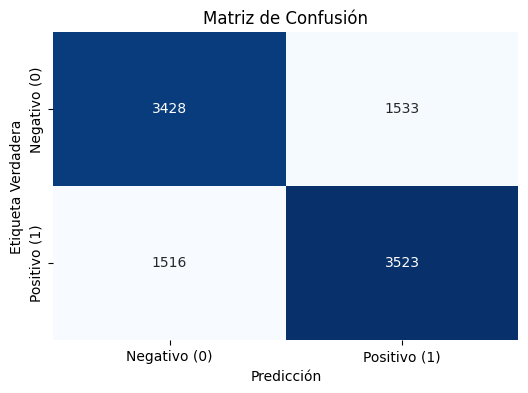

In [ ]:
# Importar las bibliotecas necesarias
import spacy
from spacy import displacy
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Cargar el modelo de spaCy para español
nlp = spacy.load("es_core_news_sm")
contador_llamadas = 0

def mostrar_arboles(text):
    global contador_llamadas
    """
    Muestra el árbol sintáctico de la frase original y luego el de la frase
    sin preposiciones, artículos, conjunciones y pronombres.

    Parámetros:
    - text (str): La frase de entrada.

    Retorno:
    - str: La frase sin preposiciones, artículos, conjunciones y pronombres.
    """
    # Analizar la frase original
    doc = nlp(text)

    # Filtrar palabras que no son preposiciones, artículos, conjunciones ni pronombres
    filtered_words = [
        token for token in doc
        if token.pos_ not in {"ADP", "DET", "CCONJ", "SCONJ", "PRON"}
    ]
    # Reconstruir la frase sin estas palabras
    filtered_sentence = " ".join([token.text for token in filtered_words])
    contador_llamadas += 1
    print(f"Llamadas a mostrar_arboles: {contador_llamadas}")

    return filtered_sentence

# Preprocesar los datos de entrada utilizando la función mostrar_arboles
X_train = train_data['review_es'].apply(mostrar_arboles)
y_train = train_data['sentimiento']
X_test = test_data['review_es'].apply(mostrar_arboles)
y_test = test_data['sentimiento']

# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()
# Ajustar el vectorizador al conjunto de entrenamiento y transformar los datos de entrenamiento
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
# Transformar los datos de prueba utilizando el vectorizador ya ajustado
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Inicializar y entrenar el modelo de Árbol de Decisión
decision_tree_model = DecisionTreeClassifier(random_state=42)
decision_tree_model.fit(X_train_tfidf, y_train)
predictions = decision_tree_model.predict(X_test_tfidf)

# Evaluar el modelo
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, predictions))

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_test, predictions)

# Crear un mapa de calor para visualizar la matriz de confusión
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

# Definir etiquetas personalizadas para los ejes
plt.xticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])
plt.yticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])

plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Etiqueta Verdadera')
plt.show()


In [ ]:
X_train = train_data['review_es']
y_train = train_data['sentimiento']
X_test = test_data['review_es']
y_test = test_data['sentimiento']


# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador al conjunto de entrenamiento y transformar los datos de entrenamiento
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Transformar los datos de prueba utilizando el vectorizador ya ajustado
X_test_tfidf = tfidf_vectorizer.transform(X_test)


Entrenamiento y Guardado del modelo

In [ ]:
# Inicializar el clasificador de árbol de decisiones
decision_tree = DecisionTreeClassifier()

# Entrenar el modelo en los datos de entrenamiento
decision_tree.fit(X_train_tfidf, y_train)


DecisionTreeClassifier()

Prueba del Modelo

In [ ]:
# Paso 1: Transformar los datos de prueba utilizando el vectorizador ya ajustado
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Paso 2: Realizar predicciones en el conjunto de prueba
y_pred = decision_tree.predict(X_test_tfidf)

# Paso 3: Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Paso 4: Mostrar el reporte de clasificación
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Paso 5: Mostrar la matriz de confusión
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))




Accuracy: 0.692

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.69      0.69      4961
           1       0.69      0.69      0.69      5039

    accuracy                           0.69     10000
   macro avg       0.69      0.69      0.69     10000
weighted avg       0.69      0.69      0.69     10000


Confusion Matrix:
[[3428 1533]
 [1547 3492]]


In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=56a05035bbac16235e76d614c89682fca5c1e4a20901f2409b58ccdaf9e57c58
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime.lime_text import LimeTextExplainer
import matplotlib.pyplot as plt

# Paso 1: Configurar el explicador de LIME
explainer = LimeTextExplainer(class_names=["Negativo", "Positivo"])  # Ajusta según tus clases

# Paso 2: Seleccionar una instancia de prueba para analizar
idx = 0  # Cambia el índice según el texto que quieras analizar
sample_text =  "Me encanta absolutamente esta película. Todo sobre ella. Casi se sintió como verme a mí y a mis amigos en la pantalla. La forma en que se filmó esta película fue una obra maestra pura, muy original y creativa. Me sentí identificado con estos personajes e incluso tuve los mismos pensamientos que algunos de ellos. Estoy realmente feliz de haberme encontrado con esta película. ¡Ojalá hubiera más genios como Justin por ahí!" # Suponiendo que X_test es un DataFrame o Series

print("Texto seleccionado para análisis:")
print(sample_text)

# Paso 3: Crear una función de predicción para LIME
def predict_proba_lime(texts):
    transformed_texts = tfidf_vectorizer.transform(texts)
    return decision_tree_model.predict_proba(transformed_texts)



# Paso 4: Generar la explicación para la muestra seleccionada
exp = explainer.explain_instance(
    sample_text,
    predict_proba_lime,
    num_features=5  # Número de palabras más importantes
)

# Paso 5: Mostrar resultados de la explicación
print("\nPalabras más importantes para la predicción:")
for word, weight in exp.as_list():
    print(f"{word}: {weight:.2f}")

# Paso 6: Visualización de la explicación
exp.show_in_notebook(text=True)  # Muestra una visualización en Jupyter Notebook

# (Opcional) Guardar la explicación en HTML para compartir
exp.save_to_file("lime_explanation.html")
print("\nLa explicación se ha guardado como 'lime_explanation.html'.")

# Paso 7: Gráfica de las palabras más importantes (opcional)
fig = exp.as_pyplot_figure()
plt.title(f"Explicación para la instancia {idx}")
plt.show()


Texto seleccionado para análisis:
Me encanta absolutamente esta película. Todo sobre ella. Casi se sintió como verme a mí y a mis amigos en la pantalla. La forma en que se filmó esta película fue una obra maestra pura, muy original y creativa. Me sentí identificado con estos personajes e incluso tuve los mismos pensamientos que algunos de ellos. Estoy realmente feliz de haberme encontrado con esta película. ¡Ojalá hubiera más genios como Justin por ahí!


NameError: name 'tfidf_vectorizer' is not defined

In [ ]:
def analyze_word_importance_lime(text):
    # Obtener la predicción de la probabilidad del texto original
    original_probs = predict_proba_lime([text])[0]
    original_class = np.argmax(original_probs)
    print(f"Texto original: '{text}'")
    print(f"Predicción original: Clase {original_class}, Probabilidades {original_probs}")

    # Tokenizar el texto en palabras individuales
    tokens = text.split()
    word_importance = []

    # Perturbar el texto eliminando una palabra a la vez
    for i, token in enumerate(tokens):
        # Crear un texto nuevo sin el token actual
        perturbed_tokens = tokens[:i] + tokens[i+1:]
        perturbed_text = " ".join(perturbed_tokens)

        # Obtener la predicción del texto perturbado
        perturbed_probs = predict_proba_lime([perturbed_text])[0]
        perturbed_class = np.argmax(perturbed_probs)

        # Calcular el cambio en la probabilidad para la clase original
        prob_change = original_probs[original_class] - perturbed_probs[original_class]
        # Guardar el resultado
        word_importance.append((token, prob_change, perturbed_class))
        print(f"Sin '{token}': Clase {perturbed_class}, Probabilidades {perturbed_probs}, Cambio en probabilidad de clase original: {prob_change}")

    # Ordenar las palabras por importancia en la probabilidad de la clase original
    word_importance = sorted(word_importance, key=lambda x: abs(x[1]), reverse=True)
    print("\nPalabras ordenadas por impacto en la predicción de la clase original:")
    for token, change, new_class in word_importance:
        print(f"Palabra '{token}': Cambio en probabilidad de clase original {change:.4f}, Nueva clase: {new_class}")

# Ejemplo de uso
text_example = "Originalmente yo era fanático de Tenacious D por su primer álbum y escuché algunas canciones pero quedé bastante decepcionado."
analyze_word_importance_lime(text_example)

Texto original: 'Originalmente yo era fanático de Tenacious D por su primer álbum y escuché algunas canciones pero quedé bastante decepcionado.'
Predicción original: Clase 1, Probabilidades [0. 1.]
Sin 'Originalmente': Clase 1, Probabilidades [0. 1.], Cambio en probabilidad de clase original: 0.0
Sin 'yo': Clase 1, Probabilidades [0. 1.], Cambio en probabilidad de clase original: 0.0
Sin 'era': Clase 1, Probabilidades [0. 1.], Cambio en probabilidad de clase original: 0.0
Sin 'fanático': Clase 1, Probabilidades [0. 1.], Cambio en probabilidad de clase original: 0.0
Sin 'de': Clase 1, Probabilidades [0. 1.], Cambio en probabilidad de clase original: 0.0
Sin 'Tenacious': Clase 1, Probabilidades [0. 1.], Cambio en probabilidad de clase original: 0.0
Sin 'D': Clase 1, Probabilidades [0. 1.], Cambio en probabilidad de clase original: 0.0
Sin 'por': Clase 1, Probabilidades [0. 1.], Cambio en probabilidad de clase original: 0.0
Sin 'su': Clase 1, Probabilidades [0. 1.], Cambio en probabilidad

In [ ]:
from lime.lime_text import LimeTextExplainer
import numpy as np

# Paso 1: Configurar el explicador de LIME
explainer = LimeTextExplainer(class_names=["Clase Negativa", "Clase Positiva"])

# Paso 2: Seleccionar una muestra del conjunto de prueba para analizar
idx = 0  # Cambia el índice según la muestra que quieras analizar
sample = X_test.iloc[idx]  # Suponiendo que X_test es un DataFrame o Series

# Paso 3: Crear una función de predicción para LIME
def predict_proba_lime(texts):
    transformed_texts = tfidf_vectorizer.transform(texts)
    return decision_tree.predict_proba(transformed_texts)

# Paso 4: Generar la explicación para la muestra seleccionada
exp = explainer.explain_instance(
    sample,
    predict_proba_lime,
    num_features=10  # Número de características explicativas
)

# Paso 5: Visualizar la explicación
print(f"Explicación para la instancia {idx}:")
print(exp.as_list())  # Muestra las palabras más relevantes para la predicción

# (Opcional) Visualizar en HTML
exp.save_to_file('lime_explanation.html')


Explicación para la instancia 0:
[('terrible', -0.23400107437628964), ('aburrido', -0.20832770639212214), ('gordo', -0.08158882240534815), ('mejores', -0.07100836869033221), ('fueron', -0.025072199389769265), ('igual', 0.023422299609276567), ('cosas', -0.023026774332453422), ('muy', 0.019609990969517165), ('ahora', 0.016877058356083538), ('embargo', 0.012778995498152585)]


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score
import joblib

# Supongamos que train_data y test_data están definidos
X_train = train_data['review_es']
y_train = train_data['sentimiento']
X_test = test_data['review_es']
y_test = test_data['sentimiento']

# Extraer la fila 808 de X_test y y_test
X_test_single = X_test.iloc[806]  # Esto es un solo string
y_test_single = y_test.iloc[806]  # Esto es un solo valor

# Asegurarte de que X_test_single esté en una lista
X_test_single = [X_test_single]

# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador al conjunto de entrenamiento y transformar los datos de entrenamiento
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Transformar los datos de prueba utilizando el vectorizador ya ajustado
X_test_tfidf = tfidf_vectorizer.transform(X_test_single)

# Supongamos que decision_tree ya ha sido entrenado
# Predecir los sentimientos para el dato de prueba
y_pred = decision_tree.predict(X_test_tfidf)

# Convertir y_test_single a una lista
y_test_single = [y_test_single]

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test_single, y_pred)
print("Accuracy:", accuracy)

# Mostrar el reporte de clasificación (opcional)
from sklearn.metrics import classification_report
print(classification_report(y_test_single, y_pred))


NameError: name 'decision_tree' is not defined

In [ ]:
from sklearn.tree import export_text
from sklearn.feature_extraction.text import TfidfVectorizer

# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador al conjunto de entrenamiento y obtener los nombres de características
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
feature_names = list(tfidf_vectorizer.get_feature_names_out())  # Convertir a lista

# Obtener la representación de texto del árbol de decisiones
text_representation = export_text(decision_tree, feature_names=feature_names)
print(text_representation)


|--- peor <= 0.02
|   |--- horrible <= 0.01
|   |   |--- mala <= 0.03
|   |   |   |--- excelente <= 0.02
|   |   |   |   |--- no <= 0.04
|   |   |   |   |   |--- terrible <= 0.01
|   |   |   |   |   |   |--- mal <= 0.04
|   |   |   |   |   |   |   |--- también <= 0.01
|   |   |   |   |   |   |   |   |--- siquiera <= 0.03
|   |   |   |   |   |   |   |   |   |--- worst <= 0.01
|   |   |   |   |   |   |   |   |   |   |--- aburrido <= 0.05
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 155
|   |   |   |   |   |   |   |   |   |   |--- aburrido >  0.05
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 19
|   |   |   |   |   |   |   |   |   |--- worst >  0.01
|   |   |   |   |   |   |   |   |   |   |--- children <= 0.02
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 6
|   |   |   |   |   |   |   |   |   |   |--- children >  0.02
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction.text import TfidfVectorizer

# Supongamos que train_data está definido
X_train = train_data['review_es']
y_train = train_data['sentimiento']

# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador al conjunto de entrenamiento
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Supongamos que decision_tree ya ha sido entrenado
# Supongamos que X_test ya está definido (las frases para las que queremos la rama)
X_test_tfidf = tfidf_vectorizer.transform(X_test[:10000])  # Tomar solo las primeras 100 frases

# Obtener la representación de texto de la ruta de decisión para cada frase específica en las primeras 100 frases del conjunto de prueba
tree = decision_tree.tree_
feature_names = tfidf_vectorizer.get_feature_names_out()
for i, test_sample_tfidf in enumerate(X_test_tfidf):
    node_indicator = decision_tree.decision_path(test_sample_tfidf)
    leave_id = decision_tree.apply(test_sample_tfidf)

    node_index = node_indicator.indices[node_indicator.indptr[0]: node_indicator.indptr[1]]

    #print("Frase completa:", X_test[9434:9435])  # Imprime la frase completa


    contador = 0
    for node_id in node_index:
        if leave_id[0] == node_id:
            continue

        if (test_sample_tfidf[0, tree.feature[node_id]] != 0):
            contador += 1  # Incrementa el contador

            threshold_sign = "<="
        else:
            threshold_sign = ">"


    if(contador >=12 ):
        print("Decision path for the test sample:",i)
        print(contador)


    # También puedes obtener la clase predicha para cada frase específica
    predicted_class = decision_tree.predict(test_sample_tfidf.reshape(1, -1))



Decision path for the test sample: 105
12
Decision path for the test sample: 179
12
Decision path for the test sample: 303
13
Decision path for the test sample: 654
15
Decision path for the test sample: 756
12
Decision path for the test sample: 1160
13
Decision path for the test sample: 1333
15
Decision path for the test sample: 3186
14
Decision path for the test sample: 3881
14
Decision path for the test sample: 3946
12
Decision path for the test sample: 4427
12
Decision path for the test sample: 4880
16
Decision path for the test sample: 6133
12
Decision path for the test sample: 6943
13
Decision path for the test sample: 7194
12
Decision path for the test sample: 7456
15
Decision path for the test sample: 7752
13
Decision path for the test sample: 7951
13
Decision path for the test sample: 8548
12
Decision path for the test sample: 8927
12
Decision path for the test sample: 9130
12
Decision path for the test sample: 9226
13
Decision path for the test sample: 9346
12


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction.text import TfidfVectorizer

# Supongamos que train_data está definido
X_train = train_data['review_es']
y_train = train_data['sentimiento']

# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador al conjunto de entrenamiento
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Supongamos que decision_tree ya ha sido entrenado
# Supongamos que X_test ya está definido (las frases para las que queremos la rama)
X_test_tfidf = tfidf_vectorizer.transform(X_test[4630:4631])  # Tomar solo las primeras 100 frases

# Obtener la representación de texto de la ruta de decisión para cada frase específica en las primeras 100 frases del conjunto de prueba
tree = decision_tree.tree_
feature_names = tfidf_vectorizer.get_feature_names_out()

for i, test_sample_tfidf in enumerate(X_test_tfidf):
    node_indicator = decision_tree.decision_path(test_sample_tfidf)
    leave_id = decision_tree.apply(test_sample_tfidf)

    node_index = node_indicator.indices[node_indicator.indptr[i]: node_indicator.indptr[i+1]]

    print("Frase completa:", X_test[4630:4631])  # Imprime la frase completa

    print("Decision path for the test sample:")
    contador = 0
    for node_id in node_index:
        if leave_id[i] == node_id:
            continue

        if (test_sample_tfidf[0, tree.feature[node_id]] != 0):
            contador += 1  # Incrementa el contador
            print(contador)
            threshold_sign = "<="
        else:
            threshold_sign = ">"
        print("decision node {} : ({} {} {})".format(
            node_id,
            feature_names[tree.feature[node_id]],
            threshold_sign,
            tree.threshold[node_id]))
    print("Contador",contador)

    # También puedes obtener la clase predicha para cada frase específica
    predicted_class = decision_tree.predict(test_sample_tfidf.reshape(1, -1))
    print("Predicted class:", predicted_class)



Frase completa: 23553    ADVERTENCIA: Los spoilers queridos Roger, dura...
Name: review_es, dtype: object
Decision path for the test sample:
decision node 0 : (peor > 0.01825712062418461)
decision node 1 : (horrible > 0.007584314327687025)
1
decision node 2 : (mala <= 0.024336369708180428)
decision node 3 : (excelente > 0.015060219913721085)
2
decision node 4 : (no <= 0.04791880585253239)
3
decision node 3664 : (nada <= 0.023901062086224556)
decision node 3665 : (siquiera > 0.014237183146178722)
4
decision node 3666 : (terrible <= 0.03819764964282513)
decision node 3667 : (aburrido > 0.025575123727321625)
decision node 3668 : (mal > 0.02599830087274313)
decision node 3669 : (peores > 0.03187531791627407)
5
decision node 3670 : (es <= 0.07870228216052055)
decision node 3671 : (minutos > 0.040880488231778145)
6
decision node 3672 : (menos <= 0.025898567400872707)
decision node 3673 : (he > 0.02099716290831566)
decision node 3674 : (actuaciones > 0.009474938735365868)
decision node 3675 :

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction.text import TfidfVectorizer

# Supongamos que train_data está definido
X_train = train_data['review_es']
y_train = train_data['sentimiento']

# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador al conjunto de entrenamiento
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Supongamos que decision_tree ya ha sido entrenado
# Supongamos que X_test ya está definido (las frases para las que queremos la rama)
X_test_tfidf = tfidf_vectorizer.transform(X_test[0:100])  # Tomar solo las primeras 100 frases

# Obtener la representación de texto de la ruta de decisión para cada frase específica en las primeras 100 frases del conjunto de prueba
tree = decision_tree.tree_
feature_names = tfidf_vectorizer.get_feature_names_out()

# Inicializar el contador fuera del bucle externo
contador = 0

for i, test_sample_tfidf in enumerate(X_test_tfidf):
    node_indicator = decision_tree.decision_path(test_sample_tfidf)
    leave_id = decision_tree.apply(test_sample_tfidf)

    print("i:", i)  # Imprime el valor de i

    if i < len(node_indicator.indptr) - 1:
        node_index = node_indicator.indices[node_indicator.indptr[i]: node_indicator.indptr[i+1]]

        if len(node_index) > 0:  # Verificar si hay nodos en el índice antes de intentar acceder
            print("Decision path for the test sample:")
            for node_id in node_index:
                if leave_id[i] == node_id:  # Usar el índice i para acceder a leave_id
                    continue

                if (test_sample_tfidf[0, tree.feature[node_id]] != 0):
                    contador += 1  # Incrementa el contador

                    threshold_sign = "<="
                else:
                    threshold_sign = ">"
            print("contador", contador)  # Imprime el valor del contador


i: 0
Decision path for the test sample:
contador 4
i: 1
i: 2
i: 3
i: 4
i: 5
i: 6
i: 7
i: 8
i: 9
i: 10
i: 11
i: 12
i: 13
i: 14
i: 15
i: 16
i: 17
i: 18
i: 19
i: 20
i: 21
i: 22
i: 23
i: 24
i: 25
i: 26
i: 27
i: 28
i: 29
i: 30
i: 31
i: 32
i: 33
i: 34
i: 35
i: 36
i: 37
i: 38
i: 39
i: 40
i: 41
i: 42
i: 43
i: 44
i: 45
i: 46
i: 47
i: 48
i: 49
i: 50
i: 51
i: 52
i: 53
i: 54
i: 55
i: 56
i: 57
i: 58
i: 59
i: 60
i: 61
i: 62
i: 63
i: 64
i: 65
i: 66
i: 67
i: 68
i: 69
i: 70
i: 71
i: 72
i: 73
i: 74
i: 75
i: 76
i: 77
i: 78
i: 79
i: 80
i: 81
i: 82
i: 83
i: 84
i: 85
i: 86
i: 87
i: 88
i: 89
i: 90
i: 91
i: 92
i: 93
i: 94
i: 95
i: 96
i: 97
i: 98
i: 99


In [ ]:
# Supongamos que decision_tree ya ha sido entrenado
# Predecir los sentimientos para el dato de prueba
y_pred = decision_tree.predict(X_test_tfidf)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test_single, y_pred)
print("Accuracy:", accuracy)

# Mostrar el reporte de clasificación (opcional)
print(classification_report(y_test_single, y_pred))


Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1

    accuracy                           1.00         1
   macro avg       1.00      1.00      1.00         1
weighted avg       1.00      1.00      1.00         1



In [ ]:
from sklearn.tree import export_text
from sklearn.feature_extraction.text import TfidfVectorizer

# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador al conjunto de entrenamiento y obtener los nombres de características
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
feature_names = list(tfidf_vectorizer.get_feature_names_out())  # Convertir a lista

# Obtener la representación de texto del árbol de decisiones
text_representation = export_text(decision_tree, feature_names=feature_names)
print(text_representation)


|--- peor <= 0.02
|   |--- horrible <= 0.01
|   |   |--- mala <= 0.02
|   |   |   |--- excelente <= 0.02
|   |   |   |   |--- no <= 0.05
|   |   |   |   |   |--- terrible <= 0.01
|   |   |   |   |   |   |--- mal <= 0.03
|   |   |   |   |   |   |   |--- aburrido <= 0.04
|   |   |   |   |   |   |   |   |--- basura <= 0.04
|   |   |   |   |   |   |   |   |   |--- mejores <= 0.01
|   |   |   |   |   |   |   |   |   |   |--- minutos <= 0.02
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 243
|   |   |   |   |   |   |   |   |   |   |--- minutos >  0.02
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 29
|   |   |   |   |   |   |   |   |   |--- mejores >  0.01
|   |   |   |   |   |   |   |   |   |   |--- desperdicio <= 0.03
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 74
|   |   |   |   |   |   |   |   |   |   |--- desperdicio >  0.03
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |  

In [ ]:
X_test_single_tfidf = tfidf_vectorizer.transform(X_test_single)


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction.text import TfidfVectorizer

# Supongamos que train_data está definido
X_train = train_data['review_es']
y_train = train_data['sentimiento']

# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador al conjunto de entrenamiento
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Supongamos que decision_tree ya ha sido entrenado
# Supongamos que X_test_single ya está definido (la frase para la que queremos la rama)
X_test_single_tfidf = tfidf_vectorizer.transform([X_test_single[0]])  # Aquí está la corrección

# Obtener la representación de texto de la ruta de decisión para la frase específica
tree = decision_tree.tree_
feature_names = tfidf_vectorizer.get_feature_names_out()
node_indicator = decision_tree.decision_path(X_test_single_tfidf)
leave_id = decision_tree.apply(X_test_single_tfidf)

node_index = node_indicator.indices[node_indicator.indptr[0]:
                                    node_indicator.indptr[1]]

print("Frase completa:", X_test_single[0])  # Imprime la frase completa

print("Decision path for the test sample:")

for node_id in node_index:
    if leave_id[0] == node_id:
        continue

    if (X_test_single_tfidf[0, tree.feature[node_id]] != 0):
        threshold_sign = "<="
    else:
        threshold_sign = ">"

    print("decision node {} : ({} {} {})".format(
        node_id,
        feature_names[tree.feature[node_id]],
        threshold_sign,
        tree.threshold[node_id]))

# También puedes obtener la clase predicha para la frase específica
predicted_class = decision_tree.predict(X_test_single_tfidf)
print("Predicted class:", predicted_class)



Frase completa: Es una pena.Hay una idea interesante aquí, pero se pierde completamente en una confusión de los efectos informáticos de estilo de CroDore 64 y una mala narración.La trama, como es, se refiere a un cazador de almas recompensas.Debe ser un cazador / un tipo de historia bastante sencillo, pero el director y / o el escritor parecen que se olvidaron de lo que se suponía que debía ser la película cuando estaban en unos tres días en la filmación.Las cosas no son ayudadas por el hecho de que el Baddie principal parece que está usando una máscara barata de Darth Maul, que intentaron disfrazarse con los colores de CG que fluye.No hay mucho que recomendar aquí, incluso el título parece impulsarlo en la oscuridad.
Decision path for the test sample:
decision node 0 : (peor > 0.01825712062418461)
decision node 1 : (horrible > 0.007584314327687025)
decision node 2 : (mala <= 0.024336369708180428)
decision node 6426 : (excelente > 0.024766826070845127)
decision node 6427 : (mala <= 0.0

In [ ]:
from sklearn.tree import _tree

def tree_to_code(tree, feature_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    feature_names = [f.replace(" ", "_") for f in feature_names]

    print("def predict(review):")

    def recurse(node, depth):
        indent = " " * depth * 4
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{}if {} <= {}:".format(indent, name, np.round(threshold, 2)))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else:  # if {} > {}".format(indent, name, np.round(threshold, 2)))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print('{}return "{}"'.format(indent, tree_.value[node]))

    recurse(0, 1)

# Llamar a la función para obtener las reglas
tree_to_code(decision_tree, feature_names)


Se han truncado las últimas 5000 líneas del flujo de salida.
                                                                                                                                                                    if cerebro <= 0.1:
                                                                                                                                                                        if seriamente <= 0.08:
                                                                                                                                                                            if defensa <= 0.05:
                                                                                                                                                                                if austen <= 0.09:
                                                                                                                                                                                  

In [ ]:
import numpy as np
from sklearn.tree import _tree

def tree_to_code(tree, feature_names, filename="tree_rules.txt"):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    feature_names = [f.replace(" ", "_") for f in feature_names]

    with open(filename, 'w') as f:
        def print_to_file(*args):
            print(*args)
            print(*args, file=f)

        print_to_file("def predict(review):")

        def recurse(node, depth):
            indent = " " * depth * 4
            if tree_.feature[node] != _tree.TREE_UNDEFINED:
                name = feature_name[node]
                threshold = tree_.threshold[node]
                print_to_file("{}if {} <= {}:".format(indent, name, np.round(threshold, 2)))
                recurse(tree_.children_left[node], depth + 1)
                print_to_file("{}else:  # if {} > {}".format(indent, name, np.round(threshold, 2)))
                recurse(tree_.children_right[node], depth + 1)
            else:
                print_to_file('{}return "{}"'.format(indent, tree_.value[node]))

        recurse(0, 1)

# Llamar a la función para obtener las reglas y guardarlas en un archivo
tree_to_code(decision_tree, feature_names)

# Nota: Asegúrate de definir `decision_tree` y `feature_names` antes de llamar a esta función


Se han truncado las últimas 5000 líneas del flujo de salida.
                                                                                                                    if gratuita <= 0.05:
                                                                                                                        if fabricantes <= 0.09:
                                                                                                                            if primera <= 0.07:
                                                                                                                                if decepción <= 0.05:
                                                                                                                                    if desnudo <= 0.03:
                                                                                                                                        if abre <= 0.02:
                                                           

In [ ]:
def get_human_readable_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    paths = []
    path = []

    def recurse(node, path, paths):
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_names[tree_.feature[node]]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 2)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 2)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]

    recurse(0, path, paths)

    # Ordenar las reglas por el número de muestras
    paths.sort(key=lambda x: x[-1][1], reverse=True)

    rules = []
    for path in paths:
        rule = "Si "
        for p in path[:-1]:
            if rule != "Si ":
                rule += " y "
            rule += str(p)
        rule += " entonces "
        classes = path[-1][0][0]
        if class_names is None:
            predicted_class = np.argmax(classes)
            rule += f"clase: {predicted_class} (probabilidad: {np.round(classes[predicted_class] / np.sum(classes), 2)})"
        else:
            predicted_class = np.argmax(classes)
            rule += f"clase: {class_names[predicted_class]} (probabilidad: {np.round(classes[predicted_class] / np.sum(classes), 2)})"
        rule += f" | basado en {path[-1][1]} muestras"
        rules.append(rule)

    return rules

# Llamar a la función para obtener las reglas legibles por humanos
human_readable_rules = get_human_readable_rules(decision_tree, feature_names, class_names=None)
for rule in human_readable_rules:
    print(rule)


Si (peor <= 0.02) y (horrible <= 0.01) y (mala <= 0.02) y (excelente <= 0.02) y (no <= 0.05) y (terrible <= 0.01) y (mal <= 0.03) y (aburrido <= 0.04) y (basura <= 0.04) y (mejores <= 0.01) y (minutos <= 0.02) y (bad <= 0.02) y (peores <= 0.05) y (aburrida <= 0.05) y (muy <= 0.01) y (malo <= 0.02) y (encantó <= 0.05) y (ni <= 0.04) y (vida <= 0.03) y (haber <= 0.02) y (worst <= 0.01) y (dinero <= 0.04) y (ridículo <= 0.03) y (mierda <= 0.05) y (gran <= 0.04) y (recomiendo <= 0.02) y (nada <= 0.03) y (awful <= 0.01) y (qué <= 0.03) y (predecible <= 0.03) y (pobre <= 0.02) y (waste <= 0.02) y (decente <= 0.07) y (mediocre <= 0.01) y (stupid <= 0.01) y (cosa <= 0.05) y (terriblemente <= 0.05) y (sexuales <= 0.05) y (desafortunadamente <= 0.04) y (seemed <= 0.02) y (inexplicable <= 0.02) y (idiota <= 0.04) y (débil <= 0.06) y (dumb <= 0.03) y (supposed <= 0.03) y (could <= 0.05) y (patética <= 0.04) y (why <= 0.03) y (revisión <= 0.05) y (habría <= 0.04) y (madera <= 0.02) y (mitad <= 0.08

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



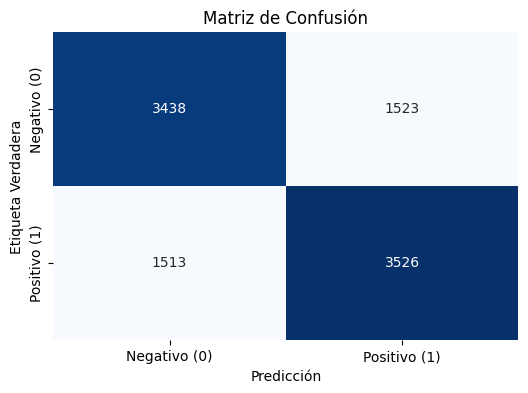

In [ ]:
# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)

# Crear un mapa de calor para visualizar la matriz de confusión
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

# Definir etiquetas personalizadas para los ejes
plt.xticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])
plt.yticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])

plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Etiqueta Verdadera')
plt.show()


##Codigo para SENTIMENTS

In [ ]:
import spacy
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Cargar spaCy y el modelo en español
nlp = spacy.load("es_core_news_sm")
contador_llamadas = 0

# Definir la función `mostrar_arboles`
def mostrar_arboles(text):
    global contador_llamadas
    """
    Muestra el árbol sintáctico de la frase original y filtra preposiciones,
    artículos, conjunciones y pronombres.

    Parámetros:
    - text (str): La frase de entrada.

    Retorno:
    - str: La frase sin preposiciones, artículos, conjunciones y pronombres.
    """
    # Analizar la frase original
    doc = nlp(text)
    # Filtrar palabras que no son útiles
    filtered_words = [
        token for token in doc
        if token.pos_ not in {"ADP", "DET", "CCONJ", "SCONJ", "PRON"}
    ]
    # Reconstruir la frase
    filtered_sentence = " ".join([token.text for token in filtered_words])
    contador_llamadas += 1
    return filtered_sentence

# Cargar los conjuntos de datos desde los archivos .pkl
train_data = pd.read_pickle('CORPUS/' + nombredecarpetaatrabajar + '/train_data.pkl')
test_data = pd.read_pickle('CORPUS/' + nombredecarpetaatrabajar + '/test_data.pkl')

# Agregar frases específicas al conjunto de entrenamiento
nuevas_frases = [
    "Desbordado de felicidad y de ansiedad",
    "Muero de ternura",
    "Dios mio gracias por mi trabajo y mi profesión la amo tanto",
    "agradecido siempre por quien está y por quien no",
    "quiero que sepas que no se va el amor que te tengo"
]
nuevas_etiquetas = ["positivo"] * len(nuevas_frases)  # Puedes cambiar las etiquetas si es necesario

# Crear un DataFrame con las frases y etiquetas personalizadas
nuevos_datos = pd.DataFrame({'text': nuevas_frases, 'sentiment': nuevas_etiquetas})

# Concatenar los nuevos datos al conjunto de entrenamiento
train_data = pd.concat([train_data, nuevos_datos], ignore_index=True)

# Aplicar `mostrar_arboles` al texto de entrenamiento y prueba
train_data['text'] = train_data['text'].apply(mostrar_arboles)
test_data['text'] = test_data['text'].apply(mostrar_arboles)

# Separar características y etiquetas
X_train = train_data['text']
y_train = train_data['sentiment']
X_test = test_data['text']
y_test = test_data['sentiment']

# Vectorización con TF-IDF
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Inicializar y entrenar el modelo de árbol de decisiones
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train_tfidf, y_train)

# Evaluar el modelo
y_pred = decision_tree.predict(X_test_tfidf)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))


ValueError: Unknown label type: unknown. Maybe you are trying to fit a classifier, which expects discrete classes on a regression target with continuous values.

In [ ]:


# Cargar spaCy y el modelo en español
nlp = spacy.load("es_core_news_sm")
contador_llamadas = 0

# Definir la función `mostrar_arboles`
def mostrar_arboles(text):
    global contador_llamadas
    """
    Muestra el árbol sintáctico de la frase original y filtra preposiciones,
    artículos, conjunciones y pronombres.

    Parámetros:
    - text (str): La frase de entrada.

    Retorno:
    - str: La frase sin preposiciones, artículos, conjunciones y pronombres.
    """
    # Analizar la frase original
    doc = nlp(text)
    # Filtrar palabras que no son útiles
    filtered_words = [
        token for token in doc
        if token.pos_ not in {"ADP", "DET", "CCONJ", "SCONJ", "PRON"}
    ]
    # Reconstruir la frase
    filtered_sentence = " ".join([token.text for token in filtered_words])
    contador_llamadas += 1
    #print(f"Procesando texto #{contador_llamadas}")
    return filtered_sentence

# Cargar los conjuntos de datos desde los archivos .pkl
train_data = pd.read_pickle('CORPUS/' + nombredecarpetaatrabajar + '/train_data.pkl')
test_data = pd.read_pickle('CORPUS/' + nombredecarpetaatrabajar + '/test_data.pkl')

# Aplicar `mostrar_arboles` al texto de entrenamiento y prueba
train_data['text'] = train_data['text'].apply(mostrar_arboles)
test_data['text'] = test_data['text'].apply(mostrar_arboles)

# Convertir las columnas 'Review' a cadenas
X_train = train_data['text'].astype(str)
X_test = test_data['text'].astype(str)
# Extraer las etiquetas de polaridad
y_train = train_data['sentiment']
y_test = test_data['sentiment']

# Vectorización con TF-IDF
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Inicializar y entrenar el modelo de árbol de decisiones
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train_tfidf, y_train)

# Evaluar el modelo
y_pred = decision_tree.predict(X_test_tfidf)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.8860103626943006

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.93      0.90       219
           1       0.90      0.83      0.86       167

    accuracy                           0.89       386
   macro avg       0.89      0.88      0.88       386
weighted avg       0.89      0.89      0.89       386


Confusion Matrix:
[[204  15]
 [ 29 138]]


In [ ]:

# Convertir las columnas 'Review' a cadenas
X_train = train_data['text'].astype(str)
X_test = test_data['text'].astype(str)
# Extraer las etiquetas de polaridad
# Extraer las etiquetas de polaridad
y_train = train_data['sentiment']
y_test = test_data['sentiment']
# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador a los datos de entrenamiento y transformar los datos
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
# Transformar los datos de prueba
X_test_tfidf = tfidf_vectorizer.transform(X_test)



In [ ]:
# Inicializar el clasificador de árbol de decisiones
decision_tree_classifier = DecisionTreeClassifier()
# Entrenar el modelo de árbol de decisiones
decision_tree_classifier.fit(X_train_tfidf, y_train)
# Predecir las etiquetas de polaridad en los datos de prueba
y_pred = decision_tree_classifier.predict(X_test_tfidf)


Precisión del modelo de árbol de decisiones: 0.7694300518134715
Accuracy: 0.7694300518134715

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.84      0.80       219
           1       0.76      0.68      0.72       167

    accuracy                           0.77       386
   macro avg       0.77      0.76      0.76       386
weighted avg       0.77      0.77      0.77       386


Confusion Matrix:
[[183  36]
 [ 53 114]]


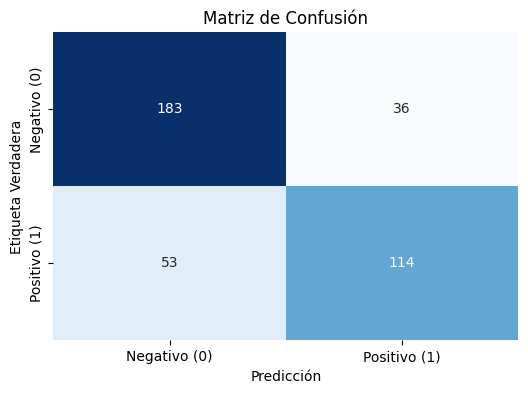

In [ ]:
# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión del modelo de árbol de decisiones:", accuracy)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Mostrar el reporte de clasificación
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
# Mostrar la matriz de confusión
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)

# Crear un mapa de calor para visualizar la matriz de confusión
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

# Definir etiquetas personalizadas para los ejes
plt.xticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])
plt.yticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])

plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Etiqueta Verdadera')
plt.show()



In [ ]:
from sklearn.model_selection import GridSearchCV

# Definir los hiperparámetros a ajustar
param_grid = {
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 3, 4, 5, 10],
    'min_samples_leaf': [1, 2, 3, 4, 5],
    'max_features': ['auto', 'sqrt', 'log2', None],
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random']
}


# Inicializar el clasificador de árbol de decisiones
decision_tree_classifier = DecisionTreeClassifier()

# Inicializar la búsqueda de hiperparámetros utilizando la validación cruzada de 5 folds
grid_search = GridSearchCV(decision_tree_classifier, param_grid, cv=5, scoring='accuracy')

# Ejecutar la búsqueda de hiperparámetros en los datos de entrenamiento
grid_search.fit(X_train_tfidf, y_train)

# Obtener el mejor modelo
best_decision_tree = grid_search.best_estimator_

# Predecir las etiquetas de polaridad en los datos de prueba utilizando el mejor modelo
y_pred = best_decision_tree.predict(X_test_tfidf)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión del modelo de árbol de decisiones después de la búsqueda de hiperparámetros:", accuracy)



/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/pytho

Precisión del modelo de árbol de decisiones después de la búsqueda de hiperparámetros: 0.9430051813471503


Precisión del modelo de árbol de decisiones: 0.9430051813471503
Accuracy: 0.9430051813471503

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95       219
           1       0.96      0.91      0.93       167

    accuracy                           0.94       386
   macro avg       0.94      0.94      0.94       386
weighted avg       0.94      0.94      0.94       386


Confusion Matrix:
[[212   7]
 [ 15 152]]


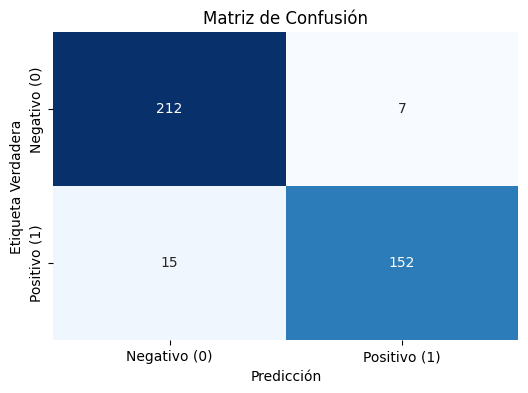

In [ ]:
# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión del modelo de árbol de decisiones:", accuracy)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Mostrar el reporte de clasificación
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
# Mostrar la matriz de confusión
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)

# Crear un mapa de calor para visualizar la matriz de confusión
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

# Definir etiquetas personalizadas para los ejes
plt.xticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])
plt.yticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])

plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Etiqueta Verdadera')
plt.show()



In [ ]:
from sklearn.tree import export_text

# Obtener la representación de texto del árbol de decisiones
text_representation = export_text(decision_tree_classifier, feature_names=feature_names)
print(text_representation)



|--- más <= 0.08
|   |--- positivo <= 0.06
|   |   |--- animado <= 0.09
|   |   |   |--- optimista <= 0.08
|   |   |   |   |--- triunfo <= 0.07
|   |   |   |   |   |--- de <= 0.09
|   |   |   |   |   |   |--- miedo <= 0.14
|   |   |   |   |   |   |   |--- resuelto <= 0.05
|   |   |   |   |   |   |   |   |--- bromista <= 0.08
|   |   |   |   |   |   |   |   |   |--- logrado <= 0.19
|   |   |   |   |   |   |   |   |   |   |--- gracioso <= 0.12
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 91
|   |   |   |   |   |   |   |   |   |   |--- gracioso >  0.12
|   |   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |   |--- logrado >  0.19
|   |   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- bromista >  0.08
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |--- resuelto >  0.05
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- miedo >  0.14
| 

In [ ]:
from sklearn.tree import _tree

def tree_to_code(tree, feature_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    feature_names = [f.replace(" ", "_") for f in feature_names]

    print("def predict(X_test):")

    def recurse(node, depth):
        indent = " " * depth * 4
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{}if X_test['{}'] <= {}:".format(indent, name, np.round(threshold, 2)))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else:  # if X_test['{}'] > {}".format(indent, name, np.round(threshold, 2)))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print('{}return "{}"'.format(indent, np.argmax(tree_.value[node])))

    recurse(0, 1)

# Llamar a la función para obtener las reglas de código
tree_to_code(decision_tree_classifier, feature_names)



def predict(X_test):
    if X_test['más'] <= 0.08:
        if X_test['positivo'] <= 0.06:
            if X_test['animado'] <= 0.09:
                if X_test['optimista'] <= 0.08:
                    if X_test['triunfo'] <= 0.07:
                        if X_test['de'] <= 0.09:
                            if X_test['miedo'] <= 0.14:
                                if X_test['resuelto'] <= 0.05:
                                    if X_test['bromista'] <= 0.08:
                                        if X_test['logrado'] <= 0.19:
                                            if X_test['gracioso'] <= 0.12:
                                                if X_test['esperanzado'] <= 0.09:
                                                    if X_test['festivo'] <= 0.13:
                                                        if X_test['seguro'] <= 0.1:
                                                            if X_test['decidido'] <= 0.06:
                                                   

In [ ]:
def get_human_readable_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    paths = []
    path = []

    def recurse(node, path, paths):
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_names[tree_.feature[node]]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 2)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 2)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]

    recurse(0, path, paths)

    # Ordenar las reglas por el número de muestras
    paths.sort(key=lambda x: x[-1][1], reverse=True)

    rules = []
    for path in paths:
        rule = "Si "
        for p in path[:-1]:
            if rule != "Si ":
                rule += " y "
            rule += str(p)
        rule += " entonces "
        classes = path[-1][0][0]
        if class_names is None:
            predicted_class = np.argmax(classes)
            rule += f"clase: {predicted_class} (probabilidad: {np.round(classes[predicted_class] / np.sum(classes), 2)})"
        else:
            predicted_class = np.argmax(classes)
            rule += f"clase: {class_names[predicted_class]} (probabilidad: {np.round(classes[predicted_class] / np.sum(classes), 2)})"
        rule += f" | basado en {path[-1][1]} muestras"
        rules.append(rule)

    return rules

# Llamar a la función para obtener las reglas legibles por humanos
human_readable_rules = get_human_readable_rules(decision_tree_classifier, feature_names, class_names=None)
for rule in human_readable_rules:
    print(rule)


Si (más <= 0.08) y (positivo <= 0.06) y (animado <= 0.09) y (optimista <= 0.08) y (triunfo <= 0.07) y (de <= 0.09) y (miedo <= 0.14) y (resuelto <= 0.05) y (bromista <= 0.08) y (logrado <= 0.19) y (gracioso <= 0.12) y (esperanzado <= 0.09) y (festivo <= 0.13) y (seguro <= 0.1) y (decidido <= 0.06) y (productivo <= 0.09) y (triunfador <= 0.08) y (brillante <= 0.1) y (victorioso <= 0.07) y (competente <= 0.08) y (autoconfianza <= 0.06) y (impactado <= 0.1) y (conquista <= 0.08) y (próspero <= 0.07) y (travesura <= 0.08) y (proactivo <= 0.07) y (confiado <= 0.11) y (despreocupado <= 0.12) y (audaz <= 0.12) y (prosperidad <= 0.09) y (atrevido <= 0.17) y (esperanzador <= 0.09) y (anonadado <= 0.1) y (intrépido <= 0.09) y (osado <= 0.12) y (incredulidad <= 0.08) y (imparable <= 0.08) y (seguridad <= 0.19) y (chispeante <= 0.14) y (boquiabierto <= 0.08) y (convencido <= 0.11) y (juerguista <= 0.09) y (incrédulo <= 0.07) y (exitoso <= 0.09) y (valiente <= 0.06) y (divertido <= 0.15) y (eh <= 0

##Codigo para Rest_mex

In [ ]:


# Cargar spaCy y el modelo en español
nlp = spacy.load("es_core_news_sm")
contador_llamadas = 0

# Definir la función `mostrar_arboles`
def mostrar_arboles(text):
    global contador_llamadas
    """
    Muestra el árbol sintáctico de la frase original y filtra preposiciones,
    artículos, conjunciones y pronombres.

    Parámetros:
    - text (str): La frase de entrada.

    Retorno:
    - str: La frase sin preposiciones, artículos, conjunciones y pronombres.
    """
    # Analizar la frase original
    doc = nlp(text)
    # Filtrar palabras que no son útiles
    filtered_words = [
        token for token in doc
        if token.pos_ not in {"ADP", "DET", "CCONJ", "SCONJ", "PRON"}
    ]
    # Reconstruir la frase
    filtered_sentence = " ".join([token.text for token in filtered_words])
    contador_llamadas += 1
    #print(f"Procesando texto #{contador_llamadas}")
    return filtered_sentence

# Cargar los conjuntos de datos desde los archivos .pkl
train_data = pd.read_pickle('CORPUS/' + nombredecarpetaatrabajar + '/train_data.pkl')
test_data = pd.read_pickle('CORPUS/' + nombredecarpetaatrabajar + '/test_data.pkl')

# Aplicar `mostrar_arboles` al texto de entrenamiento y prueba
train_data['Review'] = train_data['Review'].apply(mostrar_arboles)
test_data['Review'] = test_data['Review'].apply(mostrar_arboles)

# Convertir las columnas 'Review' a cadenas
X_train = train_data['Review'].astype(str)
X_test = test_data['Review'].astype(str)

# Extraer las etiquetas de polaridad
y_train = train_data['Polarity']
y_test = test_data['Polarity']

# Vectorización con TF-IDF
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Inicializar y entrenar el modelo de árbol de decisiones
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train_tfidf, y_train)

# Evaluar el modelo
y_pred = decision_tree.predict(X_test_tfidf)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

ValueError: [E1041] Expected a string, Doc, or bytes as input, but got: <class 'float'>

In [ ]:
# Convertir las columnas 'Review' a cadenas
X_train = train_data['Review'].astype(str)
X_test = test_data['Review'].astype(str)

# Extraer las etiquetas de polaridad
y_train = train_data['Polarity']
y_test = test_data['Polarity']


# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador a los datos de entrenamiento y transformar los datos
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Transformar los datos de prueba
X_test_tfidf = tfidf_vectorizer.transform(X_test)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Inicializar el clasificador de árbol de decisiones
decision_tree_classifier = DecisionTreeClassifier()

# Entrenar el modelo de árbol de decisiones
decision_tree_classifier.fit(X_train_tfidf, y_train)

# Predecir las etiquetas de polaridad en los datos de prueba
y_pred = decision_tree_classifier.predict(X_test_tfidf)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión del modelo de árbol de decisiones:", accuracy)

Precisión del modelo de árbol de decisiones: 0.9463160182569007


Accuracy: 0.9462508150402087

Classification Report:
              precision    recall  f1-score   support

         0.0       0.51      0.49      0.50      2541
         1.0       0.97      0.97      0.97     43469

    accuracy                           0.95     46010
   macro avg       0.74      0.73      0.74     46010
weighted avg       0.95      0.95      0.95     46010


Confusion Matrix:
[[ 1254  1287]
 [ 1186 42283]]
Accuracy: 0.9462508150402087

Classification Report:
              precision    recall  f1-score   support

         0.0       0.51      0.49      0.50      2541
         1.0       0.97      0.97      0.97     43469

    accuracy                           0.95     46010
   macro avg       0.74      0.73      0.74     46010
weighted avg       0.95      0.95      0.95     46010


Confusion Matrix:
[[ 1254  1287]
 [ 1186 42283]]


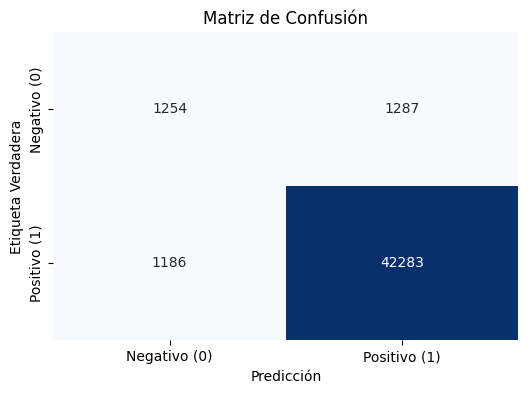

In [ ]:

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Mostrar el reporte de clasificación
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
# Mostrar la matriz de confusión
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Mostrar el reporte de clasificación
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
# Mostrar la matriz de confusión
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)

# Crear un mapa de calor para visualizar la matriz de confusión
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

# Definir etiquetas personalizadas para los ejes
plt.xticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])
plt.yticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])

plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Etiqueta Verdadera')
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
# Obtener la representación de texto del árbol de decisiones
feature_names = tfidf_vectorizer.get_feature_names_out()
feature_names = feature_names.tolist()
text_representation = export_text(decision_tree_classifier, feature_names=feature_names)
print(text_representation)

|--- mal <= 0.03
|   |--- peor <= 0.04
|   |   |--- mala <= 0.07
|   |   |   |--- no <= 0.09
|   |   |   |   |--- pésimo <= 0.06
|   |   |   |   |   |--- horrible <= 0.08
|   |   |   |   |   |   |--- sucio <= 0.08
|   |   |   |   |   |   |   |--- no <= 0.02
|   |   |   |   |   |   |   |   |--- decepción <= 0.13
|   |   |   |   |   |   |   |   |   |--- pésima <= 0.04
|   |   |   |   |   |   |   |   |   |   |--- desear <= 0.06
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 537
|   |   |   |   |   |   |   |   |   |   |--- desear >  0.06
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 8
|   |   |   |   |   |   |   |   |   |--- pésima >  0.04
|   |   |   |   |   |   |   |   |   |   |--- muy <= 0.03
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |   |--- muy >  0.03
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |   |   |   |  

In [ ]:
from sklearn.tree import _tree

def tree_to_code(tree, feature_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    print("def predict({}):".format(", ".join(feature_names)))

    def recurse(node, depth):
        indent = "    " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{}if {} <= {}:".format(indent, name, np.round(threshold,2)))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else:  # if {} > {}".format(indent, name, np.round(threshold,2)))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print("{}return {}".format(indent, tree_.value[node]))

    recurse(0, 1)

tree_to_code(decision_tree_classifier, feature_names)


def predict(00, 000, 0000co, 000a, 000adultos, 000cop, 000está, 000festivos, 000llegando, 000los, 000mil, 000pesos, 000ps, 000pueden, 0052, 008, 00am, 00desde, 00domingo, 00eur, 00h, 00horas, 00hrs, 00hs, 00mxn, 00p, 00pm, 00usd, 01, 010, 0100, 012, 014, 017, 018, 01800, 01de, 02, 0200, 021200466, 022, 03, 030, 0387, 03tenia, 04, 04264628921, 044, 0442, 04mayo18, 05, 0510, 0525, 052585548, 0530, 05cuc, 05pm, 06, 0600, 0630, 07, 0700, 0711, 0715, 0730, 08, 0800, 0820h, 0830, 0845, 08am, 09, 0900, 0915, 0915h, 098, 09h00, 0laza, 0otro, 10, 100, 1000, 10000, 100000, 1000000, 10000000, 100000000, 10000000000, 100000000000, 1000000000000000000, 10000000mil, 100000cop, 10000guía, 1000columnas, 1000pesos, 1000x10000, 1000ª, 1001, 1002, 1003, 1004, 1005, 1007, 1008, 1009, 100_x0085_, 100_x0085__x0085__x0085__x0085__x0085__x0085_, 100cuc, 100domingos, 100gr, 100k, 100km, 100m, 100m2, 100metros, 100ml, 100msnm, 100mtr, 100mts, 100mx, 100más, 100pesos, 100pesosy, 100pts, 100recomendado, 100usd, 1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




                                        return [[1. 0.]]
                            else:  # if parte > 0.03
                                return [[ 0. 16.]]
                else:  # if no > 0.09
                    if pésimo <= 0.06:
                        if hotel <= 0.03:
                            if ni <= 0.04:
                                if horrible <= 0.05:
                                    if no <= 0.16:
                                        if mediocre <= 0.05:
                                            if terrible <= 0.08:
                                                if pesimo <= 0.02:
                                                    if pedimos <= 0.07:
                                                        if sucia <= 0.06:
                                                            if sucio <= 0.09:
                                                                if sucias <= 0.08:
                                                                    if n

In [ ]:
def get_human_readable_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    paths = []
    path = []

    def recurse(node, path, paths):
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_names[tree_.feature[node]]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 2)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 2)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]

    recurse(0, path, paths)

    # Ordenar las reglas por el número de muestras
    paths.sort(key=lambda x: x[-1][1], reverse=True)

    rules = []
    for path in paths:
        rule = "Si "
        for p in path[:-1]:
            if rule != "Si ":
                rule += " y "
            rule += str(p)
        rule += " entonces "
        classes = path[-1][0][0]
        if class_names is None:
            predicted_class = np.argmax(classes)
            rule += f"clase: {predicted_class} (probabilidad: {np.round(classes[predicted_class] / np.sum(classes), 2)})"
        else:
            predicted_class = np.argmax(classes)
            rule += f"clase: {class_names[predicted_class]} (probabilidad: {np.round(classes[predicted_class] / np.sum(classes), 2)})"
        rule += f" | basado en {path[-1][1]} muestras"
        rules.append(rule)

    return rules

# Llamar a la función para obtener las reglas legibles por humanos
human_readable_rules = get_human_readable_rules(decision_tree_classifier, feature_names, class_names=None)
for rule in human_readable_rules:
    print(rule)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



##Codigo para TASS


In [ ]:


# Cargar spaCy y el modelo en español
nlp = spacy.load("es_core_news_sm")
contador_llamadas = 0

# Definir la función `mostrar_arboles`
def mostrar_arboles(text):
    global contador_llamadas
    """
    Muestra el árbol sintáctico de la frase original y filtra preposiciones,
    artículos, conjunciones y pronombres.

    Parámetros:
    - text (str): La frase de entrada.

    Retorno:
    - str: La frase sin preposiciones, artículos, conjunciones y pronombres.
    """
    # Analizar la frase original
    doc = nlp(text)
    # Filtrar palabras que no son útiles
    filtered_words = [
        token for token in doc
        if token.pos_ not in {"ADP", "DET", "CCONJ", "SCONJ", "PRON"}
    ]
    # Reconstruir la frase
    filtered_sentence = " ".join([token.text for token in filtered_words])
    contador_llamadas += 1
    #print(f"Procesando texto #{contador_llamadas}")
    return filtered_sentence

# Cargar los conjuntos de datos desde los archivos .pkl
train_data = pd.read_pickle('CORPUS/' + nombredecarpetaatrabajar + '/train_data.pkl')
test_data = pd.read_pickle('CORPUS/' + nombredecarpetaatrabajar + '/test_data.pkl')

# Aplicar `mostrar_arboles` al texto de entrenamiento y prueba
train_data['content'] = train_data['content'].apply(mostrar_arboles)
test_data['content'] = test_data['content'].apply(mostrar_arboles)

# Convertir las columnas 'Review' a cadenas
X_train = train_data['content'].astype(str)
X_test = test_data['content'].astype(str)

# Extraer las etiquetas de polaridad
y_train = train_data['sentiment_valueBinarizado']
y_test = test_data['sentiment_valueBinarizado']

# Vectorización con TF-IDF
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Inicializar y entrenar el modelo de árbol de decisiones
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train_tfidf, y_train)

# Evaluar el modelo
y_pred = decision_tree.predict(X_test_tfidf)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.6390532544378699

Classification Report:
              precision    recall  f1-score   support

         0.0       0.62      0.50      0.55       450
         1.0       0.65      0.75      0.70       564

    accuracy                           0.64      1014
   macro avg       0.63      0.62      0.62      1014
weighted avg       0.64      0.64      0.63      1014


Confusion Matrix:
[[223 227]
 [139 425]]


In [ ]:

# Convertir las columnas 'Review' a cadenas
X_train = train_data['content'].astype(str)
X_test = test_data['content'].astype(str)

# Extraer las etiquetas de polaridad
y_train = train_data['sentiment_valueBinarizado']
y_test = test_data['sentiment_valueBinarizado']


# Inicializar el vectorizador TF-IDF
tfidf_vectorizer = TfidfVectorizer()

# Ajustar el vectorizador a los datos de entrenamiento y transformar los datos
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Transformar los datos de prueba
X_test_tfidf = tfidf_vectorizer.transform(X_test)


In [ ]:
# Inicializar el clasificador de árbol de decisiones
decision_tree_classifier = DecisionTreeClassifier()

# Entrenar el modelo de árbol de decisiones
decision_tree_classifier.fit(X_train_tfidf, y_train)

# Predecir las etiquetas de polaridad en los datos de prueba
y_pred = decision_tree_classifier.predict(X_test_tfidf)


Precisión del modelo de árbol de decisiones: 0.6321499013806706
Accuracy: 0.6321499013806706

Classification Report:
              precision    recall  f1-score   support

         0.0       0.60      0.53      0.56       450
         1.0       0.66      0.71      0.68       564

    accuracy                           0.63      1014
   macro avg       0.63      0.62      0.62      1014
weighted avg       0.63      0.63      0.63      1014


Confusion Matrix:
[[238 212]
 [161 403]]


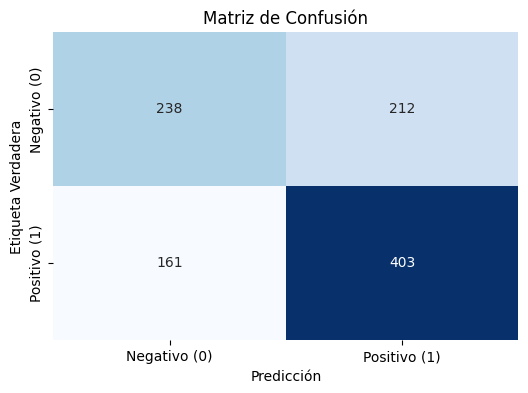

In [ ]:
# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión del modelo de árbol de decisiones:", accuracy)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
# Mostrar el reporte de clasificación
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
# Mostrar la matriz de confusión
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)

# Crear un mapa de calor para visualizar la matriz de confusión
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

# Definir etiquetas personalizadas para los ejes
plt.xticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])
plt.yticks(ticks=[0.5, 1.5], labels=["Negativo (0)", "Positivo (1)"])

plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Etiqueta Verdadera')
plt.show()


In [ ]:
from sklearn.model_selection import GridSearchCV

# Definir los hiperparámetros a ajustar
param_grid = {
    'max_depth': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': ['auto', 'sqrt', 'log2', None]
}



# Inicializar el clasificador de árbol de decisiones
decision_tree_classifier = DecisionTreeClassifier()

# Inicializar la búsqueda de hiperparámetros utilizando la validación cruzada de 5 folds
grid_search = GridSearchCV(decision_tree_classifier, param_grid, cv=5, scoring='accuracy')

# Ejecutar la búsqueda de hiperparámetros en los datos de entrenamiento
grid_search.fit(X_train_tfidf, y_train)

# Obtener el mejor modelo
best_decision_tree = grid_search.best_estimator_

# Predecir las etiquetas de polaridad en los datos de prueba utilizando el mejor modelo
y_pred = best_decision_tree.predict(X_test_tfidf)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión del modelo de árbol de decisiones después de la búsqueda de hiperparámetros:", accuracy)



/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/pytho

Precisión del modelo de árbol de decisiones después de la búsqueda de hiperparámetros: 0.6429980276134122


In [ ]:
from sklearn.tree import export_text

# Obtener la representación de texto del árbol de decisiones
text_representation = export_text(decision_tree_classifier, feature_names=feature_names)
print(text_representation)


|--- no <= 0.04
|   |--- gracias <= 0.06
|   |   |--- la <= 0.06
|   |   |   |--- el <= 0.03
|   |   |   |   |--- los <= 0.08
|   |   |   |   |   |--- se <= 0.09
|   |   |   |   |   |   |--- muertos <= 0.10
|   |   |   |   |   |   |   |--- de <= 0.05
|   |   |   |   |   |   |   |   |--- nunca <= 0.27
|   |   |   |   |   |   |   |   |   |--- vía <= 0.15
|   |   |   |   |   |   |   |   |   |   |--- déficit <= 0.07
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 62
|   |   |   |   |   |   |   |   |   |   |--- déficit >  0.07
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0.0
|   |   |   |   |   |   |   |   |   |--- vía >  0.15
|   |   |   |   |   |   |   |   |   |   |--- el_pais <= 0.14
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |   |--- el_pais >  0.14
|   |   |   |   |   |   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |   |   |   |--- nunca >  0.27
|   |   |   |   |   | 

In [ ]:
from sklearn.tree import _tree

def tree_to_code(tree, feature_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    print("def predict({}):".format(", ".join(feature_names)))

    def recurse(node, depth):
        indent = "    " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{}if {} <= {}:".format(indent, name, np.round(threshold,2)))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else:  # if {} > {}".format(indent, name, np.round(threshold,2)))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print("{}return {}".format(indent, tree_.value[node]))

    recurse(0, 1)

tree_to_code(decision_tree_classifier, feature_names)

def predict(00, 000, 000m, 000m2, 000mill, 00h, 010, 02, 023, 03, 05, 091, 09rm886o, 09twbdvm, 0ajjkxo8, 0eadvkcy, 0ey5v8di, 0f7jzns8espero, 0iif7obg, 0jpwpqfd, 0khictfn, 0l0hzkdb, 0leyuwcl, 0luyjjrm, 0m6vgw2i, 0mgit1ow, 0ohdlaf2, 0pmv0us2via, 0pzdlt4l, 0q6xyejm, 0umobsyt, 0z3f9o7u, 10, 100, 1000maneras, 100x100, 103, 107, 10h, 11, 110, 110añosdeleyenda, 112, 112cmadrid, 1180, 11m, 11mconlasvictimas, 11mconlasvíctimas, 12, 120, 121myhvg, 125, 126, 12h, 13, 130000, 135sara, 138, 1391, 13television, 13tv_aldia, 14, 140, 14000000, 144, 14xstmmv, 15, 150, 1500, 15000, 1500m, 154, 156, 15h, 16, 162, 16fnm8co, 17, 177, 17congresopopular, 17congresopp, 18, 1812, 182, 187, 19, 1927, 1972, 1988, 1992, 1994, 1997, 19f, 1a, 1ac2ind8, 1año, 1billboards, 1cbjztf9, 1cvvjhwh, 1e8clg0o, 1gyscglv, 1h7z360u, 1ikoucsd, 1ilusión, 1m, 1muerto, 1pto, 1qqpydmd, 1rt, 1s8hona5, 1sauna, 1stykcoa, 1tapon, 1vez, 1we9mple, 1xvb0jzl, 1y5svfbk, 1yuep8jm, 1yz0szsp, 1ª, 20, 200, 2002, 2003, 2007, 2008, 2009, 200m, 201

In [ ]:
def get_human_readable_rules(tree, feature_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    paths = []
    path = []

    def recurse(node, depth, path, paths):
        indent = "    " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print(f"{indent}if {name} <= {np.round(threshold, 2)}:")
            recurse(tree_.children_left[node], depth + 1, path + [f"{name} <= {np.round(threshold, 2)}"], paths)
            print(f"{indent}else:  # if {name} > {np.round(threshold, 2)}")
            recurse(tree_.children_right[node], depth + 1, path + [f"{name} > {np.round(threshold, 2)}"], paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]

    recurse(0, 0, path, paths)

    # Ordenar las reglas por el número de muestras
    paths.sort(key=lambda x: x[-1][1], reverse=True)

    rules = []
    for path in paths:
        rule = "Si "
        for p in path[:-1]:
            if rule != "Si ":
                rule += " y "
            rule += str(p[0])
        rule += " entonces "
        rule += str(path[-1][0])
        rule += f" | basado en {path[-1][1]} muestras"
        rules.append(rule)

    return rules

# Llamar a la función para obtener las reglas legibles por humanos
human_readable_rules = get_human_readable_rules(decision_tree_classifier, feature_names)
for rule in human_readable_rules:
    print(rule)


if no <= 0.04:
    if gracias <= 0.06:
        if la <= 0.06:
            if el <= 0.03:
                if los <= 0.08:
                    if se <= 0.09:
                        if muertos <= 0.1:
                            if de <= 0.05:
                                if nunca <= 0.27:
                                    if vía <= 0.15:
                                        if déficit <= 0.07:
                                            if dice <= 0.18:
                                                if crisis <= 0.1:
                                                    if qué <= 0.21:
                                                        if las <= 0.22:
                                                            if poco <= 0.22:
                                                                if pedir <= 0.11:
                                                                    if via <= 0.12:
                                                                        if hermanntert

In [ ]:
def get_human_readable_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    paths = []
    path = []

    def recurse(node, path, paths):
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_names[tree_.feature[node]]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 2)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 2)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]

    recurse(0, path, paths)

    # Ordenar las reglas por el número de muestras
    paths.sort(key=lambda x: x[-1][1], reverse=True)

    rules = []
    for path in paths:
        rule = "Si "
        for p in path[:-1]:
            if rule != "Si ":
                rule += " y "
            rule += str(p)
        rule += " entonces "
        classes = path[-1][0][0]
        if class_names is None:
            predicted_class = np.argmax(classes)
            rule += f"clase: {predicted_class} (probabilidad: {np.round(classes[predicted_class] / np.sum(classes), 2)})"
        else:
            predicted_class = np.argmax(classes)
            rule += f"clase: {class_names[predicted_class]} (probabilidad: {np.round(classes[predicted_class] / np.sum(classes), 2)})"
        rule += f" | basado en {path[-1][1]} muestras"
        rules.append(rule)

    return rules

# Llamar a la función para obtener las reglas legibles por humanos
human_readable_rules = get_human_readable_rules(decision_tree_classifier, feature_names, class_names=None)
for rule in human_readable_rules:
    print(rule)


Si (no <= 0.04) y (gracias <= 0.06) y (la <= 0.06) y (el <= 0.03) y (los <= 0.08) y (se <= 0.09) y (muertos <= 0.1) y (de <= 0.05) y (nunca <= 0.27) y (vía <= 0.15) y (déficit <= 0.07) y (dice <= 0.18) y (crisis <= 0.1) y (qué <= 0.21) y (las <= 0.22) y (poco <= 0.22) y (pedir <= 0.11) y (via <= 0.12) y (hermanntertsch <= 0.14) y (ni <= 0.2) y (valencia <= 0.11) y (donde <= 0.14) y (llamazares <= 0.15) y (000 <= 0.19) y (garzón <= 0.1) y (twitter <= 0.19) y (si <= 0.16) y (da <= 0.25) y (sus <= 0.2) y (persona <= 0.29) y (contra <= 0.08) y (mis <= 0.09) y (matas <= 0.11) y (anonymous <= 0.17) y (detain <= 0.13) y (tiene <= 0.27) y (pasa <= 0.18) y (fhf8trka <= 0.22) y (tienes <= 0.3) y (ecofin <= 0.14) y (villalar <= 0.15) y (tratamiento <= 0.29) y (encarna <= 0.28) y (2010 <= 0.12) y (elppor <= 0.13) y (funcionarios <= 0.13) y (juan_pando_ <= 0.13) y (dir <= 0.17) y (definitivamente <= 0.25) y (cuida <= 0.19) y (rebozado <= 0.29) y (insomne <= 0.21) y (absoluta <= 0.25) y (ritaaaa <= 